# Kunskapskontroll 3 Stefan Lund
## Installera moduler

In [23]:
!pip install folium

## Läs in housing.cvs, analysera, droppa rader som saknar data. 

In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import folium


housing = pd.read_csv("housing.csv")
print(housing.head())
print(housing.tail())
print(housing.info())
hc = housing.dropna() # Remove lines with null data
print(hc.info())
#print(hc.describe())
tot_population = int(hc["population"].sum())
tot_households = int(hc["households"].sum())
print(f"\n################################################\nAntal innevånare totalt:{tot_population:,}, Antal hushåll:{tot_households:,}")



   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -122.23     37.88                41.0        880.0           129.0   
1    -122.22     37.86                21.0       7099.0          1106.0   
2    -122.24     37.85                52.0       1467.0           190.0   
3    -122.25     37.85                52.0       1274.0           235.0   
4    -122.25     37.85                52.0       1627.0           280.0   

   population  households  median_income  median_house_value ocean_proximity  
0       322.0       126.0         8.3252            452600.0        NEAR BAY  
1      2401.0      1138.0         8.3014            358500.0        NEAR BAY  
2       496.0       177.0         7.2574            352100.0        NEAR BAY  
3       558.0       219.0         5.6431            341300.0        NEAR BAY  
4       565.0       259.0         3.8462            342200.0        NEAR BAY  
       longitude  latitude  housing_median_age  total_rooms  total_bedrooms

## Beräkna antal hus och viktat medelvärde för husen för varje kategori

In [52]:
# Räkna antalet för varje kategori med groupby
counts = pd.DataFrame(hc.groupby('ocean_proximity').size())

# Räkna medelpriset för alla hus
weighted_average_price = (hc['median_house_value'] * hc['households']).sum() / hc['households'].sum()
print("Viktat Medelpris alla hus:", weighted_average_price)

# Definiera en funktion för viktat medelvärde
def weighted_mean(group):
    return (group['median_house_value'] * group['households']).sum() / group['households'].sum()

# Använd groupby för att tillämpa funktionen
weighted_avg = hc.groupby('ocean_proximity').apply(weighted_mean)
weighted_avg.name = 'weighted_average_price'

counts = counts.merge(weighted_avg, on='ocean_proximity', how='left')
counts['weighted_average_price'] = counts['weighted_average_price'].astype(int)

print("Antal hus och \"Viktat medelvärde\" för huspris per kategori:")
print(counts)




Viktat Medelpris alla hus: 212598.2597609742
Antal hus och "Viktat medelvärde" för huspris per kategori:
                    0  weighted_average_price
ocean_proximity                              
<1H OCEAN        9034                  243834
INLAND           6496                  129150
ISLAND              5                  387435
NEAR BAY         2270                  267620
NEAR OCEAN       2628                  252058


C:\Users\stefa\AppData\Local\Temp\ipykernel_24036\2091688669.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg = hc.groupby('ocean_proximity').apply(weighted_mean)


## Visa huspriser på karta som går att zooma.
* Blå = 15% dyraste husen
* Lila = mellan 15% billigaste och 15% dyraste
* Röd = 15% billigaste husen

In [57]:
# Hitta de dyraste husen
threshold_expensive = hc['median_house_value'].quantile(0.85)
premium_house = hc[hc["median_house_value"] > threshold_expensive]

# Hitta de billigaste husen
threshold_cheap = hc['median_house_value'].quantile(0.15)
cheap_house = hc[hc["median_house_value"] < threshold_cheap]

# Gör en tabell med resten av husen
# Filtrera hus som inte ligger bland de 15% billigaste eller dyraste
middle_houses = hc[(hc['median_house_value'] > threshold_cheap ) & (hc['median_house_value'] < threshold_expensive )]

# Skapa en karta centrerad över Californien
map = folium.Map(location=[36.5, -121.0], zoom_start=6)

def plot_house(house_list, col, opa, rad):
    for x,h in house_list.iterrows():
        folium.CircleMarker(location=[h["latitude"], h["longitude"]], radius=rad, color=col, 
                        fill=True, fill_color=col, fill_opacity=opa, opacity=opa).add_to(map)
        
opa = 0.2 #Genomskinlighet 0 = helt genomskinlig 1=inte genomskinlig
rad = 2 #Plot radius

plot_house(middle_houses, "purple", opa, 1)
plot_house(cheap_house, "red", opa, rad)
plot_house(premium_house, "blue", opa, rad)
# Visa kartan
map

***Bild:***
*Scrollbar Karta med huspriser Blå-Dyr, Röd-billig, Lila-mellanpris*

Kartan visar följande:
* Billigaste husen ligger oftast långt från havet
  * Undantag i Norra Californien där billigaste husen kan ligga närmast havet
* I Los Angelés ligger de dyraste husen närmast havet eller väster om centrum.
   * Söder om centrum ligger ett stort område med billiga hus
   * Väster om centrum ligger det kända området "Beverliy hills" och
   * Väster om centrum ligger också universitetet UCLA, University of California, Los Angeles, https://maps.app.goo.gl/oeuKA38hJ9W3ZnVu9
* I San Fransisco ligger nästan inga hus vid havet utan de är samlade kring SanFransisco-bukten.
   * De billigaste husen i SanFransisco ligger nära bukten.
   * De dyraste husen i SanFransisco ligger oftast i utkanten av de befolkade områdena så långt från bukten som möjligt.
   * Dyra hus finns också
     * nära SanFransisco centrum, https://maps.app.goo.gl/nZLnqU9M5ZAATZhBA
     * nära Stanford university, https://maps.app.goo.gl/nHwsMYitgvQUecgF6
     * väster om Silicon Valley, https://maps.app.goo.gl/72RpYkAFbyYbMGAx5
     * Nära och öster om Berkely universitet. https://maps.app.goo.gl/yS1EkR3njxSWCquDA
* I San Diego ligger de dyraste husen nära badstränder intil havet.
   * De billigaste husen i Sandiego ligger nära hamnen, men också ganska nära havet. 


![Sanfransisco](SF.jpg)

***Bild:***
*San Fransisco Blå-Dyr, Röd-billig, Lila-mellanpris*

![LosAngeles](LA.jpg)

***Bild:***
*Los Angeles Blå-Dyr, Röd-billig, Lila-mellanpris*

## Plotta matriser för att se eventuella samband.

array([[<Axes: xlabel='median_house_value', ylabel='median_house_value'>,
        <Axes: xlabel='median_income', ylabel='median_house_value'>,
        <Axes: xlabel='total_rooms', ylabel='median_house_value'>,
        <Axes: xlabel='housing_median_age', ylabel='median_house_value'>],
       [<Axes: xlabel='median_house_value', ylabel='median_income'>,
        <Axes: xlabel='median_income', ylabel='median_income'>,
        <Axes: xlabel='total_rooms', ylabel='median_income'>,
        <Axes: xlabel='housing_median_age', ylabel='median_income'>],
       [<Axes: xlabel='median_house_value', ylabel='total_rooms'>,
        <Axes: xlabel='median_income', ylabel='total_rooms'>,
        <Axes: xlabel='total_rooms', ylabel='total_rooms'>,
        <Axes: xlabel='housing_median_age', ylabel='total_rooms'>],
       [<Axes: xlabel='median_house_value', ylabel='housing_median_age'>,
        <Axes: xlabel='median_income', ylabel='housing_median_age'>,
        <Axes: xlabel='total_rooms', ylabel='housi

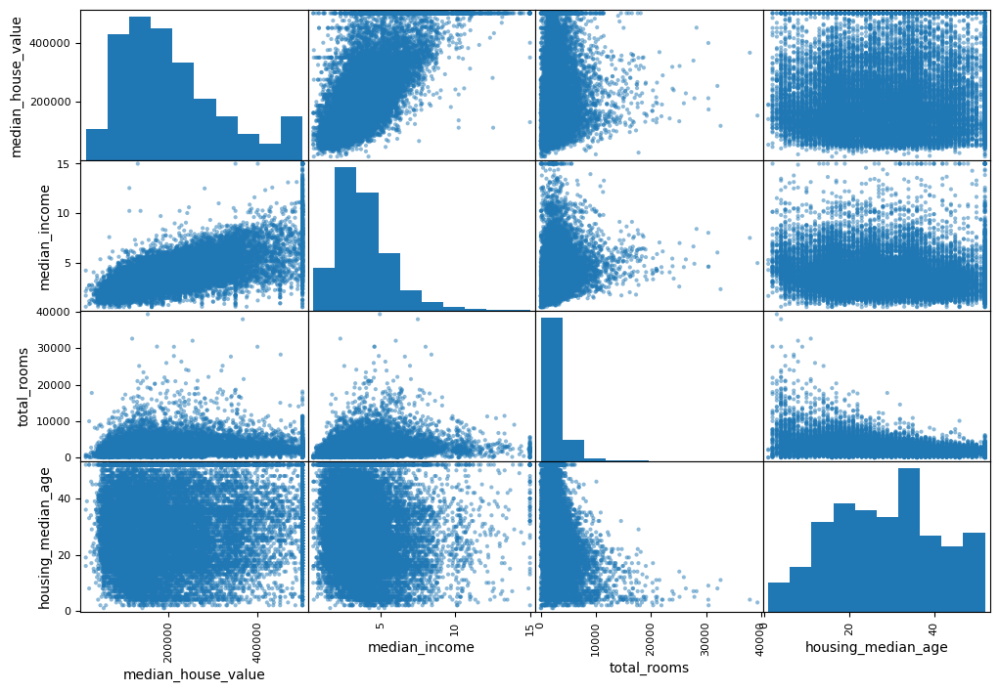

In [97]:
attributes = ["median_house_value", "median_income", "total_rooms",
              "housing_median_age"]
pd.plotting.scatter_matrix(hc[attributes], figsize=(12, 8))

# Den enda samband jag kan se av dessa grafer är att median husvärdet är tyligt kopplat till median inkomsten.
## Detta är ganska självklart eftersom människor med låg inkomst sällan har råd att köpa dyra hus.

## Skapa ett diagram för huspriser per kategori

Text(0.5, 1.0, 'Medelpriser för olika lägen')

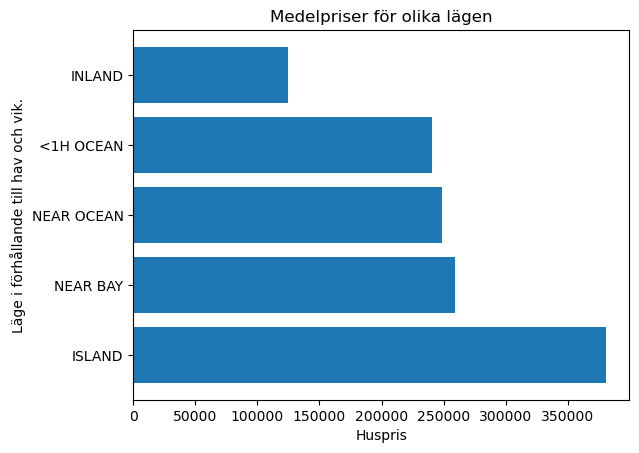

In [89]:
# Skapa stapeldiagram
df = hc.groupby('ocean_proximity', as_index=False)['median_house_value'].mean()
df_sorted = df.sort_values(by='median_house_value', ascending=False)
plt.barh(df_sorted['ocean_proximity'], df_sorted['median_house_value'])


# Lägg till etiketter och titel
plt.xlabel('Huspris')
plt.ylabel('Läge i förhållande till hav och vik.')
plt.title("Medelpriser för olika lägen")



# Samanfattning:
* Det går med statistik att visa att närheten till havet gör att huspriserna blir dyrare i Californien.

Men det finns ***betydligt viktigare faktorer till huspriset***:
* Närheten till en stor stad, de 3 största städerna i Californien ligger alla vid havet (San Fransisco, Los Angeles och San Diego ligger alla vid havet)
* I stora städer finns ofta jobb med höga löner, höga löner är kopplade till höga priser (eftersom de med höga löner vill bo nära sina arbetsplatser).
* Finns det en badstarnd vid havet så är det att attraktivt läge vilket man kan se i San Diego och Los Angeles.
* Närhet till universitet ger också höga huspriser.
  * Människor med högre utbildning har högre inkomster. Se t.ex: https://www.scb.se/hitta-statistik/sverige-i-siffror/utbildning-jobb-och-pengar/medelloner-i-sverige/#Utb 
* Man kan i samtliga 3 storstäder se stora områden med låga huspriser, precis som i Sverige finns det troligen "problemområden" med låga huspriser.
  * I dessa på kartan "röda områden" finns det alltså en lägre medianinkomst per hushåll.
 
# Självutvärdering
## 1. Har något varit utmanande i kunskapskontrollen? Om ja, hur har du hanterat det?
   * Jag hade lite problem med GitHub. Jag frågade och fick bra svar på lektionen.
   * Jag har börjat på ett nytt jobb och var dessutom tvingad att recertifiera mig för "PCI DSS" senast 4e december (studier med onlineprov), vilket tog mycket av min tid. Jag blev därför lite sen och lämnar in kunskapskontroll 3 på söndag istället för fredag.
   
## 2. Vilket betyg anser du att du ska ha och varför?
* VG
* Motivering:
  * Jag har nått lärandemålen för del 1 av kursen vad gäller kunskaper vilket visats i tidigare inläningsuppgifter och denna inläningsuppgift.
    * Vi har inte helt gått igenom det totala arbetsflödet i ett AI projekt. Men i detta projekt har jag visat att jag behärskar datainsamling, datapreparering, visualisering ch utvärdering. Modeller för inlärning och avancerad databehandlig har vi inte kommit in på än och det hoppas jag kunna behärska längre fram.
  * Jag har de färdigheter som krävs:
    * Utföra databehandling i Pandas
    * Utföra datavisualisering i Matplotlib
    * Utföra versionshantering med Git och Github

  * Kompetenser (ansvar och självständighet)
    * Jag kan och har jobbat med olika utvecklingsverktyg för pytonprogrammering, både Pandas, Visual studio code och i konsol.
    * Jag kan hantera data med felsökning. I detta projekt droppade jag data rader. Jag har också normaliserat huspriserna i min tabell
    * Jag har valt eget paket, folium, för att får en scrollbar karta, vilket underlättar analysen.

## 3. Något du vill lyfta fram till Antonio?
  * Kallelsen i Teams har inte riktigt fungerat för mig. Jag har fått använda "länken" till Teams-mötet som delades ut under lektion 1.